In [1]:
import scvelo as scv
import scanpy as sc
import cellrank as cr
import numpy as np
import pandas as pd
import anndata as ad

In [2]:
scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=100, frameon=False,
                              figsize = [5,5])
cr.settings.verbosity = 2
rc2_loom_path = '/project/gca/yuzhao1/work/final_RC2rna/upstream/'
gca_loom_path = '/project/gca/yuzhao1/work/final_GCArna/upstream/'
input_path = '/project/gca/yuzhao1/work/final_RC2rna/velocity/epithelial/'
SampleIDs = pd.read_csv("/project/gca/yuzhao1/work/final_RC2rna/metadata/SampleIDs.csv")['SampleID']

In [ ]:
######################## part 1: process ##########################

In [ ]:
# loomdata = []
# for i in SampleIDs:
#     if('PP' in i or 'POU' in i):
#         temp = scv.read(rc2_loom_path + i + '/velocyto/' + i + '.loom', cache=True)
#     if('TI' in i or 'AC' in i):
#         temp = scv.read(gca_loom_path + i + '/velocyto/' + i + '.loom', cache=True)
#     barcodes = [bc.replace(':','_').replace('x','-1') for bc in temp.obs.index.tolist()]
#     temp.obs.index = barcodes
#     temp.var_names_make_unique()
#     loomdata.append(temp)

In [ ]:
# # concatenate the looms
# loomdata_union = ad.concat(loomdata)

In [ ]:
# # save
# import pickle
# filename = input_path+'loomdata_union.pkl'
# pickle.dump(loomdata_union, 
#             open(filename, 'wb'))

In [ ]:
import pickle
filename = input_path+'loomdata_union.pkl'
loomdata_union = pickle.load(open(filename, 'rb'))

In [ ]:
# merge matrices into the original adata object
adata = sc.read_h5ad(input_path+'adata_input.h5ad')

In [ ]:
# add metadata and visualize
cell_meta = pd.read_csv(input_path+"metadata.csv")
adata.obs['anno1'] = cell_meta['anno1'].values

In [ ]:
adata = scv.utils.merge(adata, loomdata_union)

In [ ]:
# additional process steps
# normalize X, spliced and unspliced
# pre-process, pre-filter all tiny noises
scv.pp.filter_genes(adata, min_shared_counts=20)
scv.pp.normalize_per_cell(adata, enforce=True) 
scv.pp.log1p(adata)
sc.pp.regress_out(adata, ['nCount_RNA', 'percent.mt', 'CC.Difference'])
sc.pp.scale(adata, max_value=10)

In [ ]:
tempann = adata.copy()
sc.tl.pca(tempann, svd_solver='arpack', n_comps=50)
import scanpy.external as sce
sce.pp.harmony_integrate(tempann, 'Patient_ID', max_iter_harmony = 20)
adata.obsm['X_pca'] = tempann.obsm['X_pca_harmony']
adata.obsm['X_pca']

In [ ]:
sc.pp.neighbors(adata, n_neighbors=20, n_pcs=50)

In [ ]:
scv.pp.moments(adata, use_rep='X_pca', n_pcs=50, 
               n_neighbors=20, use_highly_variable=True)

In [ ]:
scv.pl.proportions(adata, groupby='anno1', save=None)

In [ ]:
# save dataset as anndata format
adata.write(input_path+'adata_preprocessed_ReadyToSubset_stochatic.h5ad')

In [ ]:
######################## part 2.1: Run stochastic model with differential kinetics ###############

In [ ]:
# read the processed data from above
adata = sc.read_h5ad(input_path+'adata_preprocessed_ReadyToSubset_stochatic.h5ad')

scv.tl.velocity(adata, diff_kinetics=True, mode='stochastic')

!jupyter nbextension enable --py widgetsnbextension

scv.tl.velocity_graph(adata, n_neighbors=20, n_jobs=4)

In [ ]:
############ part 2.2: Subset to pouch and run stochastic model with differential kinetics ###########

In [3]:
# read the processed data from above
adata = sc.read_h5ad(input_path+'adata_preprocessed_ReadyToSubset_stochatic.h5ad')
DimRec = pd.read_csv(input_path+"umap.csv", header=None)
adata.obsm['X_umap'] = DimRec.to_numpy()
# add metadata and visualize
cell_meta = pd.read_csv(input_path+"metadata.csv")
adata.obs['anno1'] = cell_meta['anno1'].values

In [4]:
DimRec = pd.read_csv(input_path+"umap.csv", header=None)
adata.obsm['X_umap'] = DimRec.to_numpy()


In [5]:
adata = adata[adata.obs['biopsy_location'].isin(['POU'])]

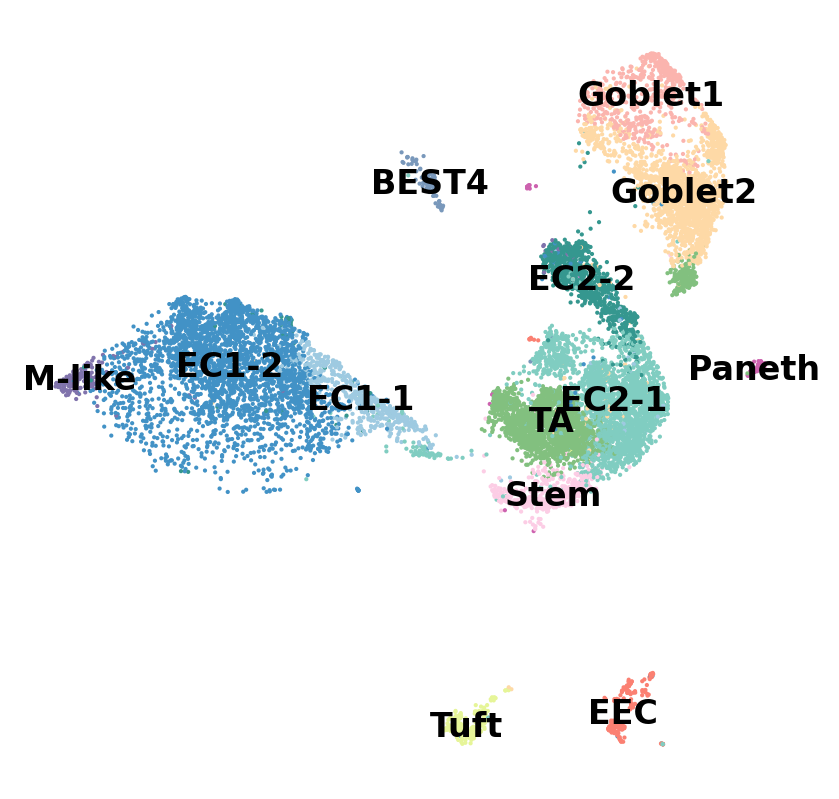

In [7]:
sc.pl.umap(adata, color=['anno1'], legend_loc='on data', title='', 
           frameon=False, save=False,
                     palette={"Stem" : '#fccde5', #purple
                                  "TA" : '#82c07f', # green
                                  "EC1-1" : '#9ecae1',
                                  "EC1-2" : '#4292c6',
                                  "EC2-1" : '#80cdc1',
                                  "EC2-2" : '#35978f',
                                  "Goblet1" : '#fbb4ae',
                                  "Goblet2" : '#fed9a6',
                                  "M-like" : '#8073ac',
                                  "BEST4" : '#7998bb',
                                  "Paneth" : '#cd62af',
                                  "EEC" : '#fb8072',
                                  "Tuft" : '#e6f598'})

In [8]:
adata

AnnData object with n_obs × n_vars = 13108 × 11228
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Sample_ID', 'Doublet_score', 'biopsy_location', 'Patient_ID', 'percent.mt', 'percent.rb', 'log10GenesPerUMI', 'S.Score', 'G2M.Score', 'Phase', 'CC.Difference', 'Sample_ID_Corrected', 'category1', 'RNA_snn_res.0.5', 'seurat_clusters', 'seurat_clusters_res0.5', 'RNA_snn_res.0.8', 'seurat_clusters_res0.8', 'RNA_snn_res.1', 'seurat_clusters_res1', 'RNA_snn_res.1.2', 'seurat_clusters_res1.2', 'RNA_snn_res.1.5', 'seurat_clusters_res1.5', 'RNA_snn_res.2', 'seurat_clusters_res2', 'RNA_snn_res.2.5', 'seurat_clusters_res2.5', 'anno1', 'embedding1', 'embedding2', 'barcode', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'gene_count_corr', 'mean', 'std'
    uns: 'anno1_colors', 'neighbors'
    obsm: 'X_harmony_umap', 'X_pca', 'X_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

In [9]:
sc.pp.neighbors(adata, n_neighbors=20, use_rep='X_pca', n_pcs=50)


In [10]:
scv.pp.moments(adata, use_rep='X_pca', n_pcs=50, 
               n_neighbors=20, use_highly_variable=True)

computing moments based on connectivities
    finished (0:00:05) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [11]:
scv.tl.velocity(adata, diff_kinetics=True, mode='stochastic')

!jupyter nbextension enable --py widgetsnbextension

scv.tl.velocity_graph(adata, n_neighbors=20, n_jobs=4)

computing velocities
    finished (0:00:08) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK
computing velocity graph (using 4/64 cores)


  0%|          | 0/13108 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/home/yuzhao1/yuzhao1/software/conda/gca-env/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


In [12]:
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=300, frameon=False,
                              figsize = [5,5])

saving figure to file ./figures/scvelo_pouch_directions.pdf


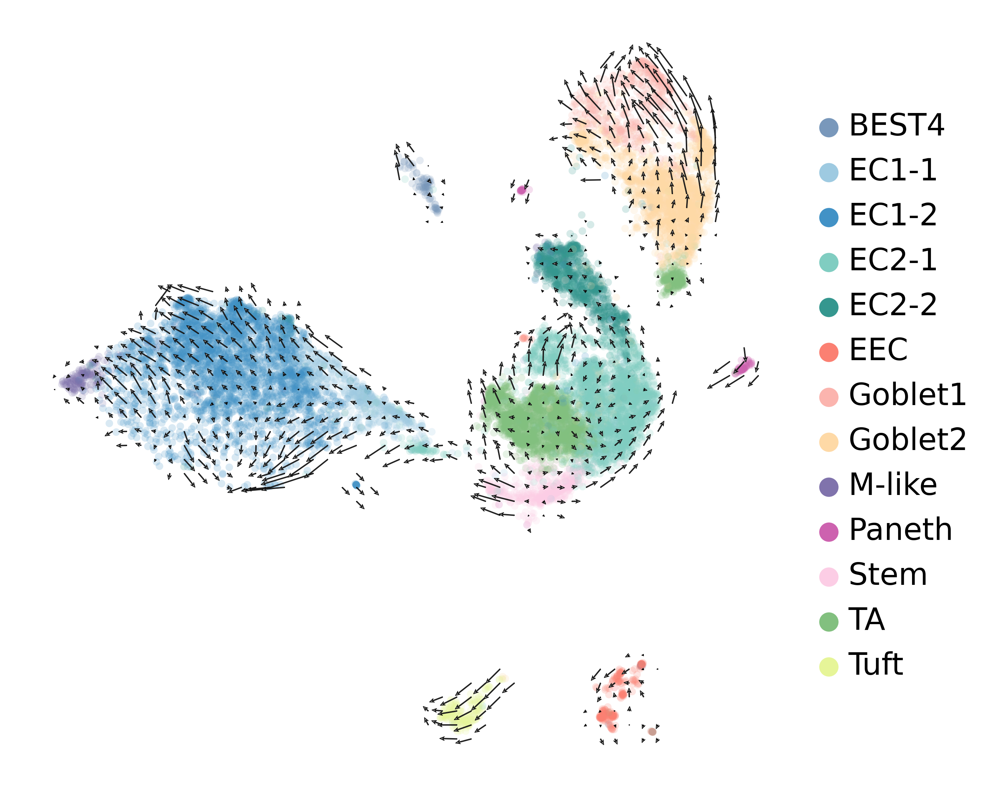

In [15]:
scv.pl.velocity_embedding_grid(adata, basis='X_umap', color='anno1', legend_loc='right margin', size= 30,
                               save='pouch_directions.pdf', title='', scale=0.25,
                               palette={"Stem" : '#fccde5', #purple
                                  "TA" : '#82c07f', # green
                                  "EC1-1" : '#9ecae1',
                                  "EC1-2" : '#4292c6',
                                  "EC2-1" : '#80cdc1',
                                  "EC2-2" : '#35978f',
                                  "Goblet1" : '#fbb4ae',
                                  "Goblet2" : '#fed9a6',
                                  "M-like" : '#8073ac',
                                  "BEST4" : '#7998bb',
                                  "Paneth" : '#cd62af',
                                  "EEC" : '#fb8072',
                                  "Tuft" : '#e6f598'})

saving figure to file ./figures/scvelo_pouch_stream.pdf


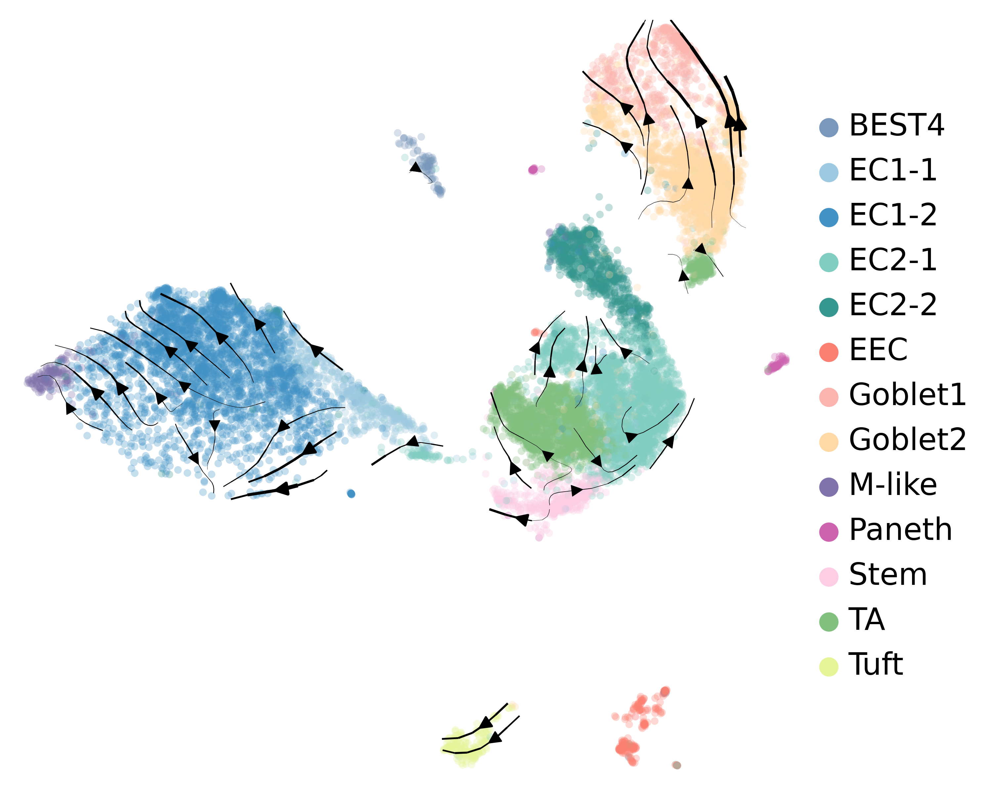

In [16]:
scv.pl.velocity_embedding_stream(adata, basis='X_umap', color=['anno1'],  
                                 density=1.5, cutoff_perc=5, min_mass=3.2,size=30,
                                 smooth =None, integration_direction = 'both',legend_loc='right margin',
                                 save='pouch_stream.pdf', title='',
                                 palette={"Stem" : '#fccde5', #purple
                                  "TA" : '#82c07f', # green
                                  "EC1-1" : '#9ecae1',
                                  "EC1-2" : '#4292c6',
                                  "EC2-1" : '#80cdc1',
                                  "EC2-2" : '#35978f',
                                  "Goblet1" : '#fbb4ae',
                                  "Goblet2" : '#fed9a6',
                                  "M-like" : '#8073ac',
                                  "BEST4" : '#7998bb',
                                  "Paneth" : '#cd62af',
                                  "EEC" : '#fb8072',
                                  "Tuft" : '#e6f598'})


In [ ]:
# # save dataset as anndata format
# adata.write(input_path+'pouch/adata_stochastic_output.h5ad')

In [ ]:
######################## part 3: visualize union ##########################

In [ ]:
# reload dataset
adata = sc.read_h5ad(input_path+'adata_stochastic_output.h5ad')

In [ ]:
# add metadata and visualize
cell_meta = pd.read_csv(input_path+"metadata.csv")
adata.obs['anno1'] = cell_meta['anno1'].values

In [ ]:
# # load new umap from cell metadata:
# cell_meta = pd.read_csv(input_path+"metadata.csv")
# adata.obsm['X_umap'] = np.vstack((cell_meta['embedding1'].to_numpy(), cell_meta['embedding2'].to_numpy())).T

In [ ]:
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=300, frameon=False,
                              figsize = [5,5])

In [ ]:
sc.pl.umap(adata, color=['anno1'], legend_loc='right margin', title='', save='.pdf',
           frameon=False,
           palette={"Stem" : '#fccde5', #purple
                                  "TA" : '#82c07f', # green
                                  "EC1-1" : '#9ecae1',
                                  "EC1-2" : '#4292c6',
                                  "EC2-1" : '#80cdc1',
                                  "EC2-2" : '#35978f',
                                  "Goblet1" : '#fbb4ae',
                                  "Goblet2" : '#fed9a6',
                                  "M-like" : '#8073ac',
                                  "BEST4" : '#7998bb',
                                  "Paneth" : '#cd62af',
                                  "EEC" : '#fb8072',
                                  "Tuft" : '#e6f598'})

In [ ]:
scv.pl.velocity_embedding_grid(adata, basis='X_umap', color='anno1', legend_loc='right margin', size= 20,
                               save='union_directions_ondata.pdf', title='', scale=0.25,
                               palette={"Stem" : '#fccde5', #purple
                                  "TA" : '#82c07f', # green
                                  "EC1-1" : '#9ecae1',
                                  "EC1-2" : '#4292c6',
                                  "EC2-1" : '#80cdc1',
                                  "EC2-2" : '#35978f',
                                  "Goblet1" : '#fbb4ae',
                                  "Goblet2" : '#fed9a6',
                                  "M-like" : '#8073ac',
                                  "BEST4" : '#7998bb',
                                  "Paneth" : '#cd62af',
                                  "EEC" : '#fb8072',
                                  "Tuft" : '#e6f598'})

In [ ]:
scv.pl.velocity_embedding_stream(adata, basis='X_umap', color=['anno1'],  
                                 density=2, cutoff_perc=5, min_mass=3.2,size=10,
                                 smooth =None, integration_direction = 'both',legend_loc='right margin',
                                 save='union_stream_ondata.pdf', title='',
                                palette={"Stem" : '#fccde5', #purple
                                  "TA" : '#82c07f', # green
                                  "EC1-1" : '#9ecae1',
                                  "EC1-2" : '#4292c6',
                                  "EC2-1" : '#80cdc1',
                                  "EC2-2" : '#35978f',
                                  "Goblet1" : '#fbb4ae',
                                  "Goblet2" : '#fed9a6',
                                  "M-like" : '#8073ac',
                                  "BEST4" : '#7998bb',
                                  "Paneth" : '#cd62af',
                                  "EEC" : '#fb8072',
                                  "Tuft" : '#e6f598'})

In [ ]:
############### part 4: downstream analysis: union ###############

In [ ]:
x = adata.var.index[np.where(adata.var['velocity_genes'] )]
np.savetxt(input_path+"epithelial/velocity_genes.csv", x, delimiter=",", fmt='%s')

In [ ]:
scv.tl.rank_velocity_genes(adata, groupby='anno1', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head(20)

df.to_csv(input_path+"velocity_genes_differential_by_anno1.csv", sep=",", 
          index = False, header=True)

In [ ]:
df.columns.values.tolist()


scv.pl.velocity(adata, ["NR1H4", "MECOM", "ARID5B", "SOX6", "SATB2", "EHF",
                        "ZBTB10", "MLXIP", "TFCP2L1", "ZBTB7C", "MYB"], color='anno1',
                ncols=1, save = 'union_markers.pdf', dpi=300, size = 0.5)

In [ ]:
############### part 4: downstream analysis: union ###############

In [18]:
x = adata.var.index[np.where(adata.var['velocity_genes'] )]
np.savetxt(input_path+"pouch_velocity_genes.csv", x, delimiter=",", fmt='%s')

In [19]:
scv.tl.rank_velocity_genes(adata, groupby='anno1', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head(20)

df.to_csv(input_path+"pouch_velocity_genes_differential_by_anno1.csv", sep=",", 
          index = False, header=True)

ranking velocity genes
    finished (0:00:24) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [21]:
scv.pl.velocity(adata, ["NR1H4", "MECOM", "ARID5B", "SOX6", "SATB2", "EHF",
                        "ZBTB10", "MLXIP", "TFCP2L1", "ZBTB7C", "MYB"], color='anno1',
                ncols=1, save = 'pouch_markers.pdf', dpi=300, size = 2)

saving figure to file ./figures/scvelo_pouch_markers.pdf
